# Set Up Colab Notebook


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
if not os.path.exists('/content/drive/MyDrive/FIREFALL2022'):
    !mkdir -p /content/drive/MyDrive/FIREFALL2022
%cd /content/drive/MyDrive/FIREFALL2022

if "DQN_Atari" not in os.listdir("."):
    !git clone https://github.com/msinto93/DQN_Atari.git
%cd DQN_Atari/


/content/drive/MyDrive/FIREFALL2022
/content/drive/MyDrive/FIREFALL2022/DQN_Atari


In [ ]:
!apt-get update > /dev/null 2>&1 
!apt-get install -y xvfb python-opengl > /dev/null 2>&1
!pip install gym pyvirtualdisplay > /dev/null 2>&1


In [ ]:
!pip install atari-py > /dev/null 2>&1
if "ROM" not in os.listdir('.'):
    !wget http://www.atarimania.com/roms/Roms.rar
    !unrar e ./Roms.rar ./ROM/
!python -m atari_py.import_roms . > /dev/null 2>&1


In [ ]:
!pip install gym==0.19
import gym
# create and reset the environment
env = gym.make("Pong-v0")
state = env.reset()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 27.5 MB/s 
  Created wheel for gym: filename=gym-0.19.0-py3-none-any.whl size=1663117 sha256=95ce5464a16b8891c6942756f7c9fe483dd8e0b5b7fd781c9547997a7e37393c
  Stored in directory: /root/.cache/pip/wheels/ef/9d/70/8bea53f7edec2fdb4f98d9d64ac9f11aea95dfcb98099d7712
Successfully built gym
  Attempting uninstall: gym
    Found existing installation: gym 0.25.2
    Uninstalling gym-0.25.2:
      Successfully uninstalled gym-0.25.2


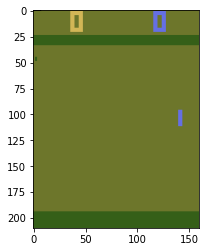

In [ ]:
from matplotlib import pyplot as plt

# render a single screen
screen = env.render(mode='rgb_array')
plt.imshow(screen)
plt.show()

In [ ]:
# View the different actions
env.get_action_meanings()

['NOOP', 'FIRE', 'RIGHT', 'LEFT', 'RIGHTFIRE', 'LEFTFIRE']

In [ ]:
# sample a random action
action = env.action_space.sample()

# take a step in the environment with that action
env.reset()
frame, reward, terminal, _ = env.step(action)

# view the observation shape, reward, and whether or not the game has reached a terminal state
print("Observation shape:", frame.shape)
print("Immediate Reward:", reward)
print("Game Ended?", terminal)

Observation shape: (210, 160, 3)
Immediate Reward: 0.0
Game Ended? False


In [ ]:
from tqdm import trange
import numpy as np

def run_random_agent(env, episodes = 10, max_steps=2000):
  """
  Run a random agent in a given environment.
  : param env: the environment that the agent should run in
  : type env: OpenAI Gym Environment
  : param episodes: number of episodes to run for
  : type episodes: int
  : param max_steps: maximum number of steps in each episode
  : type max_steps: int
  : return: the rendered screens for all episodes, the reward for each episode
  : rtype: list(Numpy Array), list(float)
  """
  # keep track of all rendered screens and rewards for each episode
  screens = []
  rewards = []

  # run for multiple episodes
  for episode in range(10):
    # reset environment and episode reward
    episode_reward = 0
    env.reset()
    
    # run for max number of steps
    for step in trange(max_steps):
      # render the current frame and append it to screens
      screen = env.render(mode = 'rgb_array')
      screens.append(screen)

      # select a random action from the environment
      action = env.action_space.sample()

      # get the reward and terminal state
      _, reward, terminal, _ = env.step(action)
      episode_reward += reward

      # stop if we have reached a terminal state
      if terminal: break
    # append the final reward
    rewards.append(episode_reward)
  return screens, rewards




In [ ]:
# create a pong environment and get the screens and rewards
env = gym.make("Pong-v0")
screens, rewards = run_random_agent(env, episodes=10, max_steps=2000)

# print the average and standard deviation of the rewards
print(
    "\nAverage Reward {} +- {}".format(
        np.mean(rewards),
        np.std(rewards)
    )
)

 66%|██████▌   | 1323/2000 [00:00<00:00, 1793.15it/s]


Average Reward -20.4 +- 0.9165151389911681


In [ ]:
from tqdm import tqdm
import numpy as np
import cv2

def create_video(screens, filename):
  """
  Create a mp4 video that saves rendered screens.

  : param screens: the screens or frames from the environment
  : type screens: list(Numpy Array)
  : param filename: the name output video file
  : type filename: str
  : return: None
  """
  # get the height and width of a single frame
  height, width, _ = screens[0].shape

  # get the fourcc code for mp4 videos
  fourcc = cv2.VideoWriter_fourcc('M','P','4','V')

  # create a video for the environment
  video = cv2.VideoWriter(filename, fourcc, 60, (width, height))

  # write each frame for the video
  for screen in tqdm(screens):
    # flip RGB to BGR for cv2
    screen = cv2.cvtColor(screen, cv2.COLOR_RGB2BGR)
    # write frame
    video.write(screen)

  # save the video and close the writer
  cv2.destroyAllWindows()
  video.release()


In [ ]:
# create a video for the pong environment
create_video(screens, "pong_video.mp4")

100%|██████████| 11639/11639 [00:02<00:00, 5769.47it/s]


In [ ]:
from IPython.display import HTML
from base64 import b64encode

def render_video(filename):
  """
  Render a saved mp4 video.

  :param filename: filename of video to render
  :type filename: str
  :return: rendered html video
  :rtype: IPython HTML
  """

  mp4 = open(filename,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
            <video width=400 controls>
              <source src="%s" type="video/mp4">
            </video>
            """ % data_url
          )

In [ ]:
render_video("pong_video.mp4")

In [ ]:
def run_custom_environment(env_name):
  """
  Run the entire dataset exploration on a custom environment.

  :param env_name: name of the OpenAI Gym Environment
  :type env_name: str
  :return: rendered video of random agent in environment
  :rtype: IPython HTML
  """
  env = gym.make(env_name)
  screens, rewards = run_random_agent(env, episodes=10, max_steps=2000)

  # print the average and standard deviation of the rewards
  print(
      "\nAverage Reward {} +- {}".format(
          np.mean(rewards),
          np.std(rewards)
      )
  )
  # create a video for the custom environment
  create_video(screens, "{}.mp4".format(env_name))

  # render video for custom environment
  return render_video("{}.mp4".format(env_name))

In [ ]:
env = gym.make("Qbert-v0")
state = env.reset

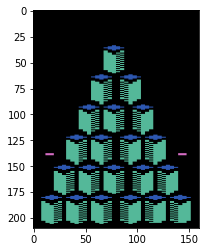

In [ ]:
screen = env.render(mode='rgb_array')
plt.imshow(screen)
plt.show()

In [ ]:
env.get_action_meanings()

['NOOP', 'FIRE', 'UP', 'RIGHT', 'LEFT', 'DOWN']

In [ ]:
# sample a random action
action = env.action_space.sample()

# take a step in the environment with that action
env.reset()
frame, reward, terminal, _ = env.step(action)

# view the observation shape, reward, and whether or not the game has reached a terminal state
print("Observation shape:", frame.shape)
print("Immediate Reward:", reward)
print("Game Ended?", terminal)

Observation shape: (210, 160, 3)
Immediate Reward: 0.0
Game Ended? False


In [ ]:
from tqdm import trange
import numpy as np

def run_random_agent(env, episodes = 10, max_steps=2000):
  """
  Run a random agent in a given environment.
  : param env: the environment that the agent should run in
  : type env: OpenAI Gym Environment
  : param episodes: number of episodes to run for
  : type episodes: int
  : param max_steps: maximum number of steps in each episode
  : type max_steps: int
  : return: the rendered screens for all episodes, the reward for each episode
  : rtype: list(Numpy Array), list(float)
  """
  # keep track of all rendered screens and rewards for each episode
  screens = []
  rewards = []

  # run for multiple episodes
  for episode in range(10):
    # reset environment and episode reward
    episode_reward = 0
    env.reset()
    
    # run for max number of steps
    for step in trange(max_steps):
      # render the current frame and append it to screens
      screen = env.render(mode = 'rgb_array')
      screens.append(screen)

      # select a random action from the environment
      action = env.action_space.sample()

      # get the reward and terminal state
      _, reward, terminal, _ = env.step(action)
      episode_reward += reward

      # stop if we have reached a terminal state
      if terminal: break
    # append the final reward
    rewards.append(episode_reward)
  return screens, rewards

In [ ]:
# create a pong environment and get the screens and rewards
env = gym.make("Qbert-v0")
screens, rewards = run_random_agent(env, episodes=10, max_steps=2000)

# print the average and standard deviation of the rewards
print(
    "\nAverage Reward {} +- {}".format(
        np.mean(rewards),
        np.std(rewards)
    )
)

 25%|██▍       | 498/2000 [00:00<00:00, 1689.41it/s]


Average Reward 147.5 +- 73.69701486491837


In [ ]:
from tqdm import tqdm
import numpy as np
import cv2

def create_video(screens, filename):
  """
  Create a mp4 video that saves rendered screens.

  : param screens: the screens or frames from the environment
  : type screens: list(Numpy Array)
  : param filename: the name output video file
  : type filename: str
  : return: None
  """
  # get the height and width of a single frame
  height, width, _ = screens[0].shape

  # get the fourcc code for mp4 videos
  fourcc = cv2.VideoWriter_fourcc('M','P','4','V')

  # create a video for the environment
  video = cv2.VideoWriter(filename, fourcc, 60, (width, height))

  # write each frame for the video
  for screen in tqdm(screens):
    # flip RGB to BGR for cv2
    screen = cv2.cvtColor(screen, cv2.COLOR_RGB2BGR)
    # write frame
    video.write(screen)

  # save the video and close the writer
  cv2.destroyAllWindows()
  video.release()

In [ ]:
# create a video for the BeamRider environment
create_video(screens, "qbert.mp4")

100%|██████████| 4477/4477 [00:02<00:00, 1822.29it/s]


In [ ]:
from IPython.display import HTML
from base64 import b64encode

def render_video(filename):
  """
  Render a saved mp4 video.

  :param filename: filename of video to render
  :type filename: str
  :return: rendered html video
  :rtype: IPython HTML
  """

  mp4 = open(filename,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
            <video width=400 controls>
              <source src="%s" type="video/mp4">
            </video>
            """ % data_url
          )

In [ ]:
render_video("qbert.mp4")

In [ ]:
run_custom_environment(env_name="Qbert-v0")

 22%|██▏       | 435/2000 [00:00<00:00, 1766.58it/s]



Average Reward 112.5 +- 67.3145600891813


100%|██████████| 4194/4194 [00:00<00:00, 4829.35it/s]
